# Testing additive hypothesis

For neurons that are stim-tuned during the maintenance period, are they additively recruited in load-3 trials to maintain memory of stimulus information?

In [22]:
import numpy as np 
import sys
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import scipy
import os
import importlib
import pandas as pd

sys.path.append('/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils')
import load_data as ld 
import lfp_utils as lu
import rate_neuron_utils as rn
from bootstrap_method import *

In [23]:
delay = 150
condn_phrase = 'delay'
condn_num = delay

# condn_key = f'{condn_phrase}{condn_num}'

## load data

In [24]:
# the models with > 0.7 accuracy are:
all_models_dir = '/home/nuttidalab/Documents/renee/sternberg/multiload_1_2_3'

model_paths = ['Task_sternberg_N_1000_Jitter_5_3_2026_06_03_014901.mat', 
               'Task_sternberg_N_1000_Jitter_5_3_2026_06_03_034721.mat', 
               'Task_sternberg_N_1000_Jitter_5_3_2026_06_06_031000.mat', 
               'Task_sternberg_N_1000_Jitter_5_3_2026_06_06_041152.mat', 
               'Task_sternberg_N_1000_Jitter_5_3_2026_06_06_180002.mat', 
               'Task_sternberg_N_1000_Jitter_5_3_2026_06_06_233744.mat', 
               'Task_sternberg_N_1000_Jitter_5_3_2026_06_07_023239.mat', 
               'Task_sternberg_N_1000_Jitter_5_3_2026_06_07_043128.mat', 
               'Task_sternberg_N_1000_Jitter_5_3_2026_06_07_063128.mat', 
               'Task_sternberg_N_1000_Jitter_5_3_2026_06_07_063647.mat', 
               'Task_sternberg_N_1000_Jitter_5_3_2026_06_07_153131.mat']

model_names = [os.path.basename(m)[:-4] for m in model_paths]

In [25]:
model_name = model_names[0]
model_dir = os.path.join(all_models_dir, model_name)

# find files for this delay of interest
data_files = ld.find_files_keywords(model_dir, [f'delay{delay}'])
# neural data
_, rates_data_match = ld.load_neural_rate_data(model_name, condn_phrase, condn_num, other_labels= "balance_match",
                                            all_models_dir = all_models_dir, load_LFP=False)
_, rates_data_stim = ld.load_neural_rate_data(model_name, condn_phrase, condn_num, other_labels= "balance_stim",
                                            all_models_dir = all_models_dir, load_LFP=False)
# concatenate
rates_data = np.concatenate((rates_data_match, rates_data_stim), axis=0)
print(rates_data.shape)

trial_labels_match, trial_perfs_match, trial_outputs_match = ld.load_bhv_rate_data(model_name, condn_phrase, condn_num,
                                                    other_labels="balance_match",
                                                    all_models_dir=all_models_dir)
trial_labels_stim, trial_perfs_stim, trial_outputs_stim = ld.load_bhv_rate_data(model_name, condn_phrase, condn_num,
                                                    other_labels="balance_stim",
                                                    all_models_dir=all_models_dir)
trial_labels = np.concatenate((trial_labels_match, trial_labels_stim), axis=0)
trial_perfs = np.concatenate((trial_perfs_match, trial_perfs_stim), axis=0)

settings = ld.load_settings_rate_data(model_name, condn_phrase, condn_num,
                                      other_labels="balance_stim",
                                      all_models_dir=all_models_dir)

stim1_stimtuning = np.load(os.path.join(model_dir, 'stim1_tuning_nonparametric.npz'))['stim1_tuning']
maint_stimtuning = np.load(os.path.join(model_dir, 'stim1_tuning_duringdelay_nonparametric.npz'))['stim1_tuning']
load_tuning = rn.calc_load_tuning_multiload(model_name, condn_phrase, condn_num, 
                                other_labels = "balance_stims",
                                all_models_dir=all_models_dir)
exc_ind, inh_ind = ld.get_celltype_label(model_name, all_models_dir=all_models_dir)


(780, 1000, 450)
Loading behavioral data...


## plot example trial activity

### plotting trials separately

/tmp/ipykernel_299295/2415961480.py:22: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/2415961480.py:23: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


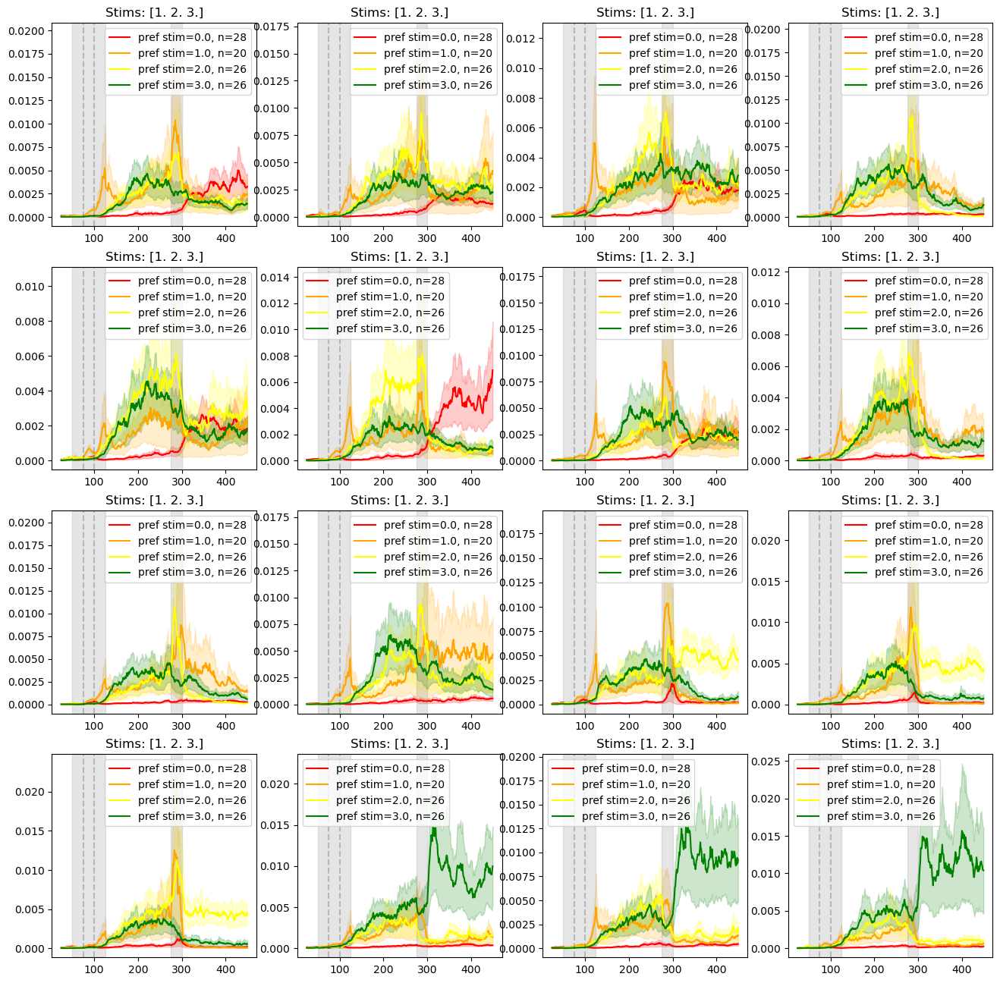

In [32]:
trial_stim_pattern = [1, 2, 3] # example 
load=3

# find trials that match
trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
stim1s = np.unique(neuron_idxs_tuning)

trial_frs = rates_data[trial_idxs, :, :]
trial_frs[:,:,:25] = np.nan
fig, axs = plt.subplots(4,4, figsize=(16,16))
axs = axs.flatten()
colors = ['r','orange', 'yellow', 'g']
for i, trial_fr in enumerate(trial_frs[:16]):
    ax = axs[i]
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_labels[trial_idxs[i], 2:5]}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_299295/3077066359.py:22: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/3077066359.py:23: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


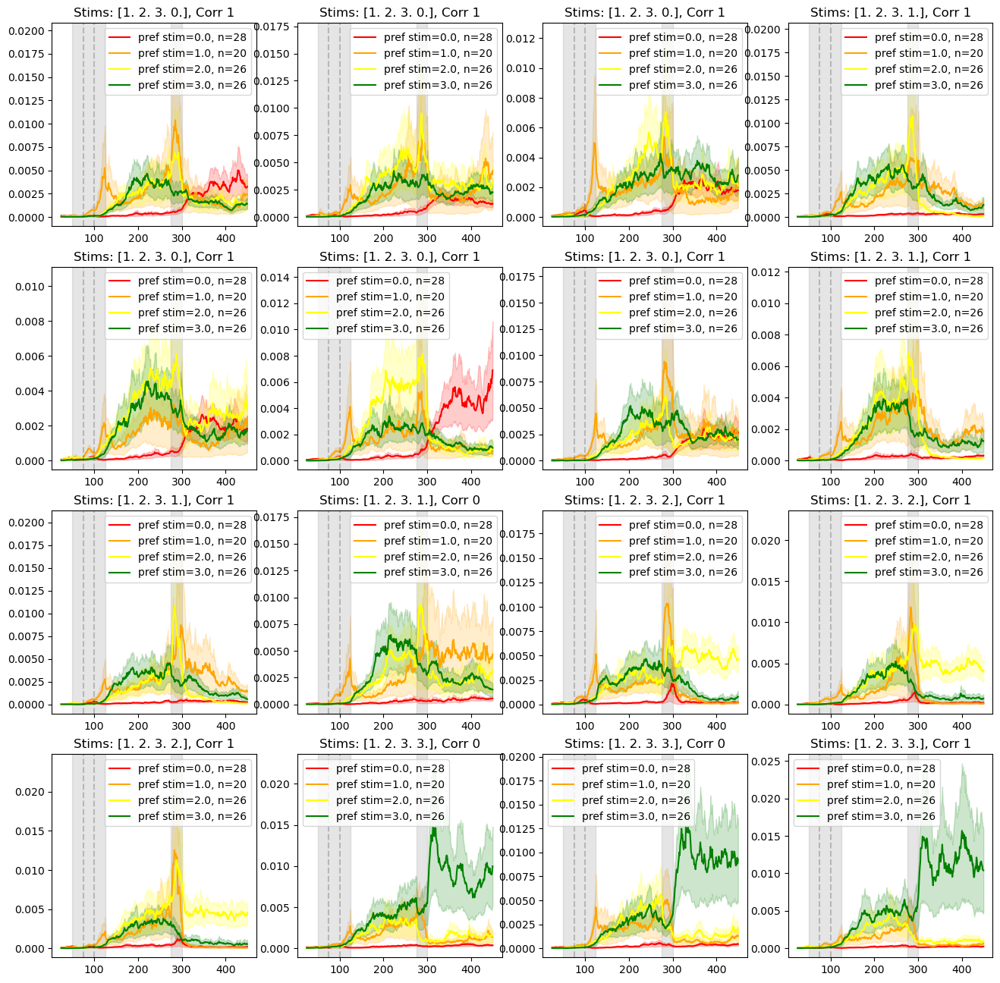

In [35]:
trial_stim_pattern = [1, 2, 3] # example 
load=3

# find trials that match
trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
stim1s = np.unique(neuron_idxs_tuning)

trial_frs = rates_data[trial_idxs, :, :]
trial_frs[:,:,:25] = np.nan
fig, axs = plt.subplots(4,4, figsize=(16,16))
axs = axs.flatten()
colors = ['r','orange', 'yellow', 'g']
for i, trial_fr in enumerate(trial_frs[:16]):
    ax = axs[i]
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_labels[trial_idxs[i], 2:6]}, Corr {trial_perfs[trial_idxs[i]]}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_299295/3546890399.py:22: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/3546890399.py:23: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


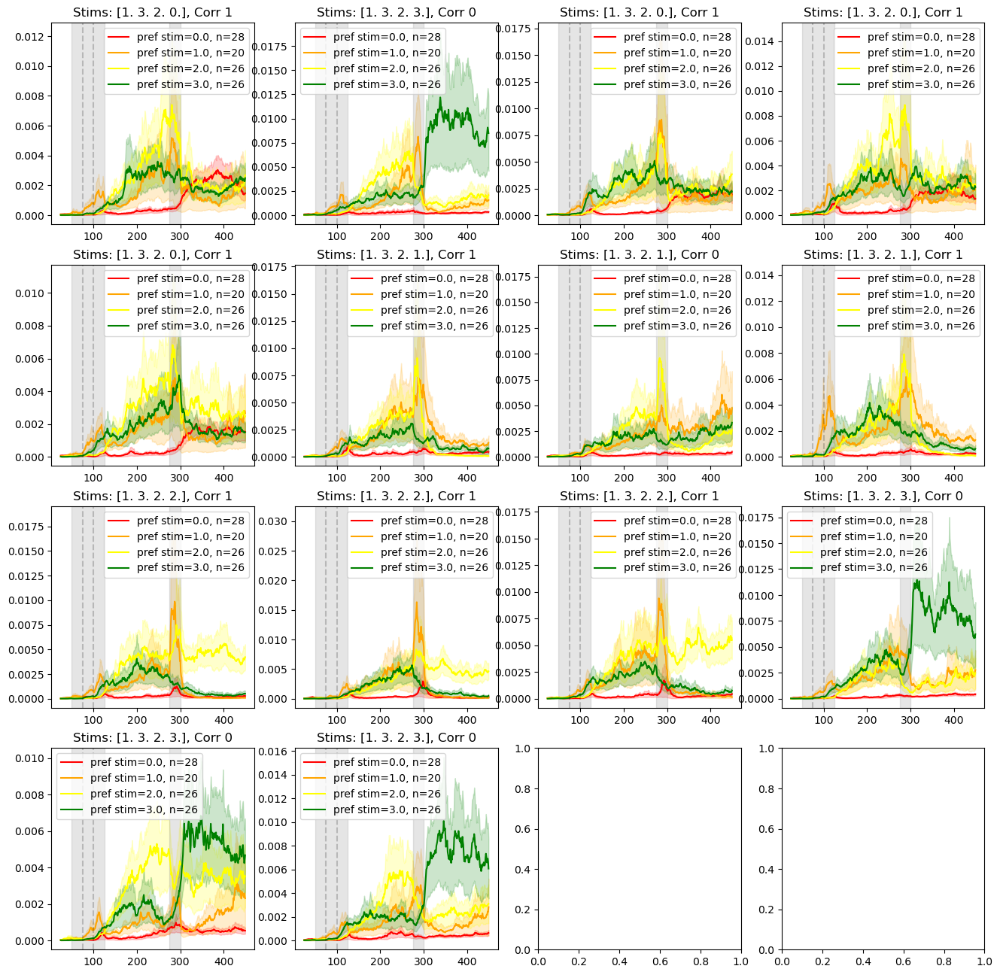

In [36]:
trial_stim_pattern = [1,3,2] # example 
load=3

# find trials that match
trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
stim1s = np.unique(neuron_idxs_tuning)

trial_frs = rates_data[trial_idxs, :, :]
trial_frs[:,:,:25] = np.nan
fig, axs = plt.subplots(4,4, figsize=(16,16))
axs = axs.flatten()
colors = ['r','orange', 'yellow', 'g']
for i, trial_fr in enumerate(trial_frs[:16]):
    ax = axs[i]
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_labels[trial_idxs[i], 2:6]}, Corr {trial_perfs[trial_idxs[i]]}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_299295/3123531196.py:22: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/3123531196.py:23: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


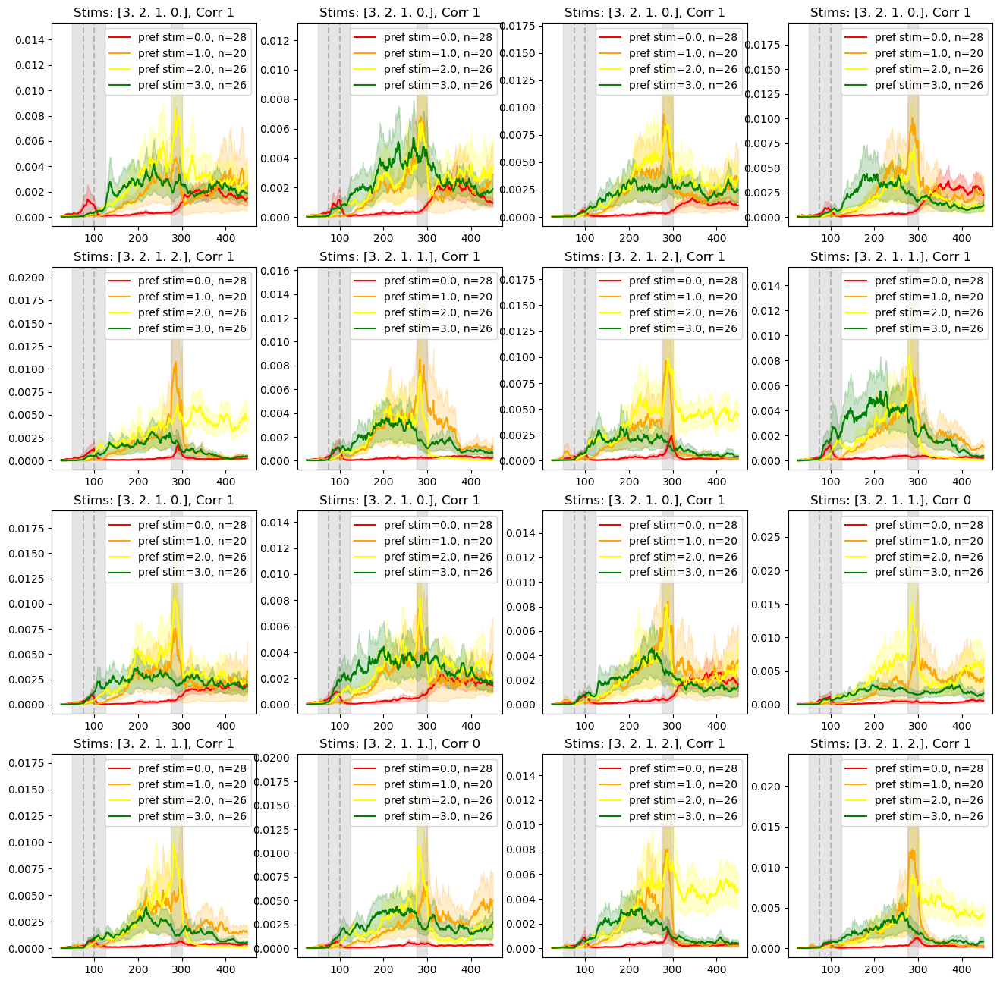

In [37]:
trial_stim_pattern = [3, 2, 1] # example 
load=3

# find trials that match
trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
stim1s = np.unique(neuron_idxs_tuning)

trial_frs = rates_data[trial_idxs, :, :]
trial_frs[:,:,:25] = np.nan
fig, axs = plt.subplots(4,4, figsize=(16,16))
axs = axs.flatten()
colors = ['r','orange', 'yellow', 'g']
for i, trial_fr in enumerate(trial_frs[:16]):
    ax = axs[i]
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_labels[trial_idxs[i], 2:6]}, Corr {trial_perfs[trial_idxs[i]]}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_299295/3619647314.py:22: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/3619647314.py:23: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


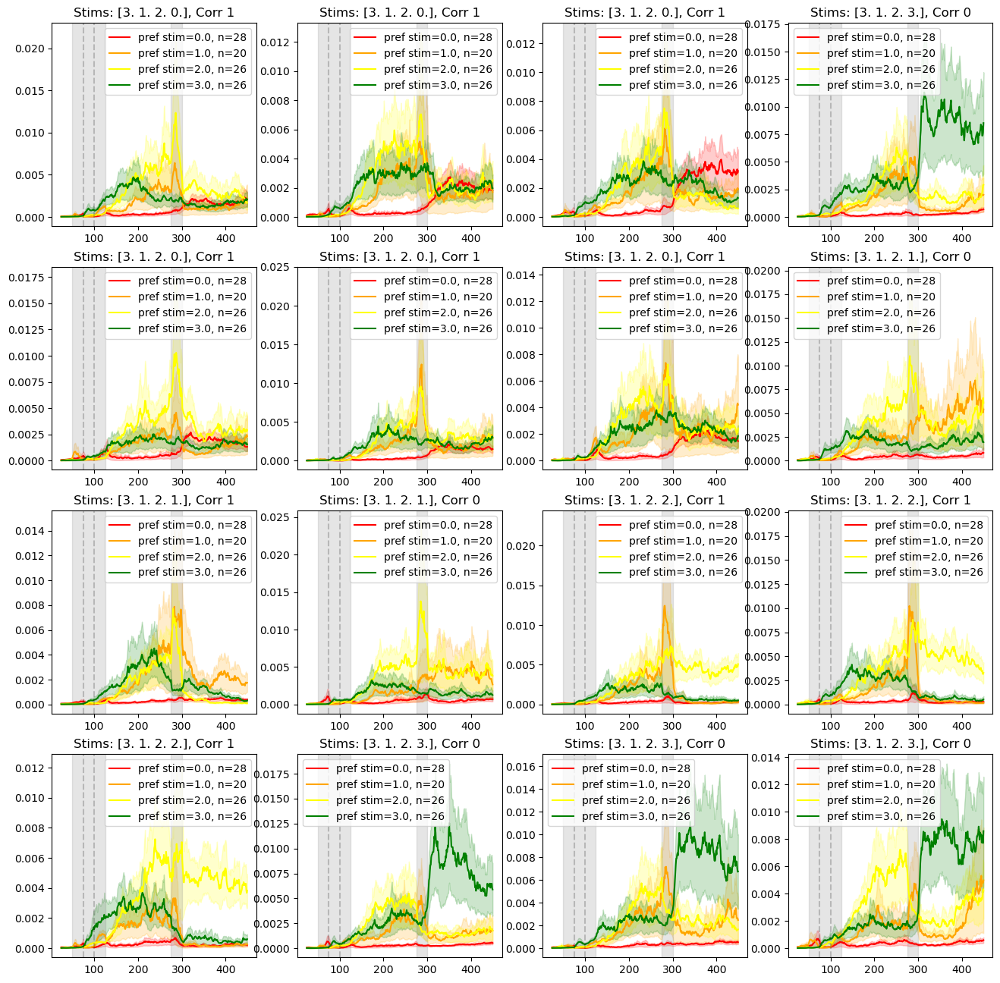

In [38]:
trial_stim_pattern = [3, 1, 2] # example 
load=3

# find trials that match
trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
stim1s = np.unique(neuron_idxs_tuning)

trial_frs = rates_data[trial_idxs, :, :]
trial_frs[:,:,:25] = np.nan
fig, axs = plt.subplots(4,4, figsize=(16,16))
axs = axs.flatten()
colors = ['r','orange', 'yellow', 'g']
for i, trial_fr in enumerate(trial_frs[:16]):
    ax = axs[i]
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_labels[trial_idxs[i], 2:6]}, Corr {trial_perfs[trial_idxs[i]]}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_299295/1338150131.py:22: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/1338150131.py:23: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


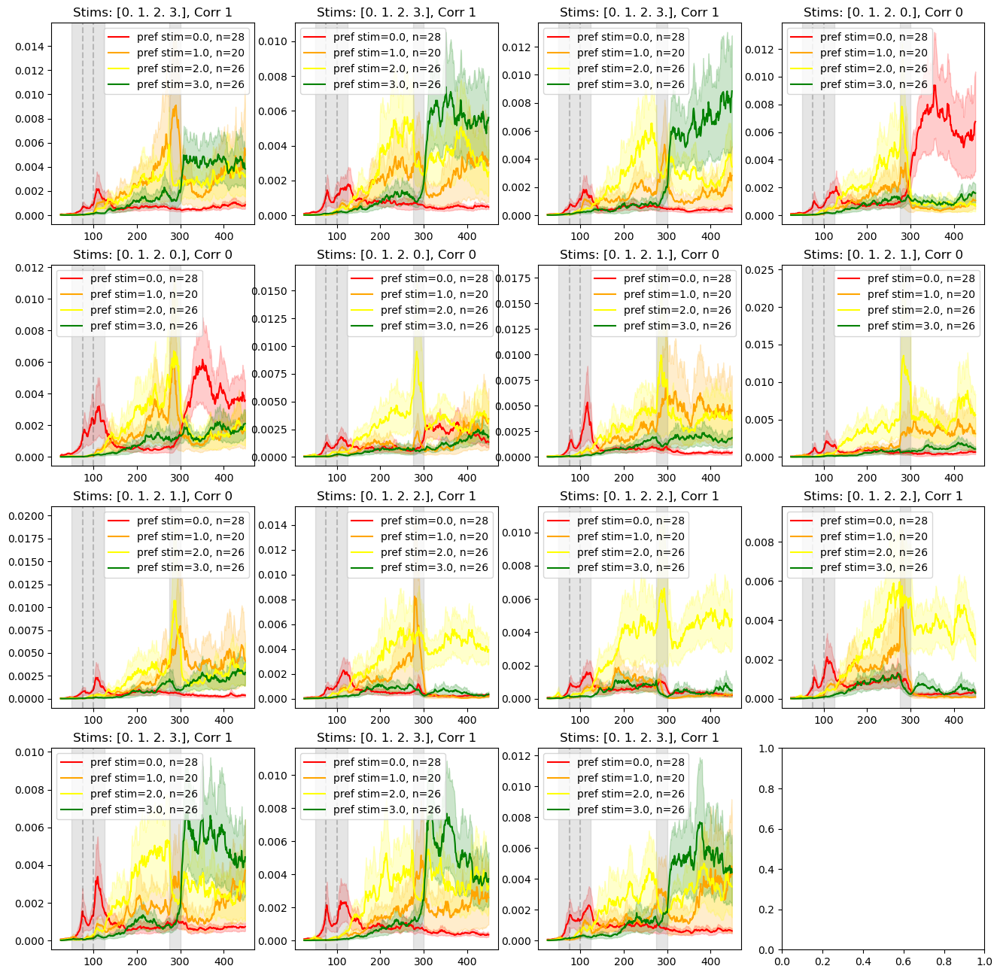

In [39]:
trial_stim_pattern = [0, 1, 2] # example 
load=3

# find trials that match
trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
stim1s = np.unique(neuron_idxs_tuning)

trial_frs = rates_data[trial_idxs, :, :]
trial_frs[:,:,:25] = np.nan
fig, axs = plt.subplots(4,4, figsize=(16,16))
axs = axs.flatten()
colors = ['r','orange', 'yellow', 'g']
for i, trial_fr in enumerate(trial_frs[:16]):
    ax = axs[i]
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_labels[trial_idxs[i], 2:6]}, Corr {trial_perfs[trial_idxs[i]]}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_299295/1475787639.py:22: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/1475787639.py:23: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


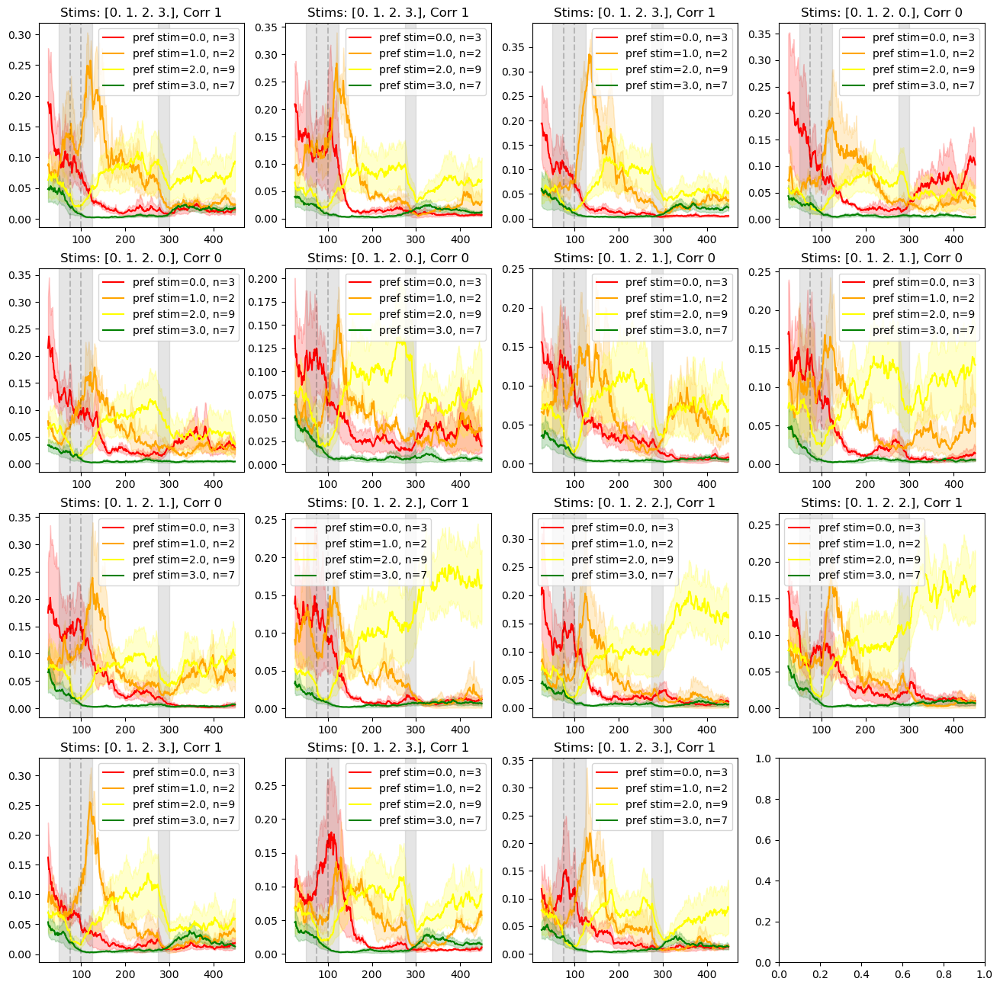

In [ ]:
# check out the inhibitory
trial_stim_pattern = [0, 1, 2] # example 
load=3

# find trials that match
trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
neuron_idxs = np.intersect1d(maint_tuned_only, inh_ind) # example: only look at inhibitory neurons
neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
stim1s = np.unique(neuron_idxs_tuning)

trial_frs = rates_data[trial_idxs, :, :]
trial_frs[:,:,:25] = np.nan
fig, axs = plt.subplots(4,4, figsize=(16,16))
axs = axs.flatten()
colors = ['r','orange', 'yellow', 'g']
for i, trial_fr in enumerate(trial_frs[:16]):
    ax = axs[i]
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_labels[trial_idxs[i], 2:6]}, Corr {trial_perfs[trial_idxs[i]]}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

### plotting mean of matching trials

In [29]:
from itertools import permutations

trial_stims = [1, 2, 3]
trial_stim_patterns = list(permutations(trial_stims))
trial_stim_patterns

[(1, 2, 3), (1, 3, 2), (2, 1, 3), (2, 3, 1), (3, 1, 2), (3, 2, 1)]

### exc neurons only

#### all trials

/tmp/ipykernel_336438/300476420.py:22: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_336438/300476420.py:27: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_336438/300476420.py:28: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


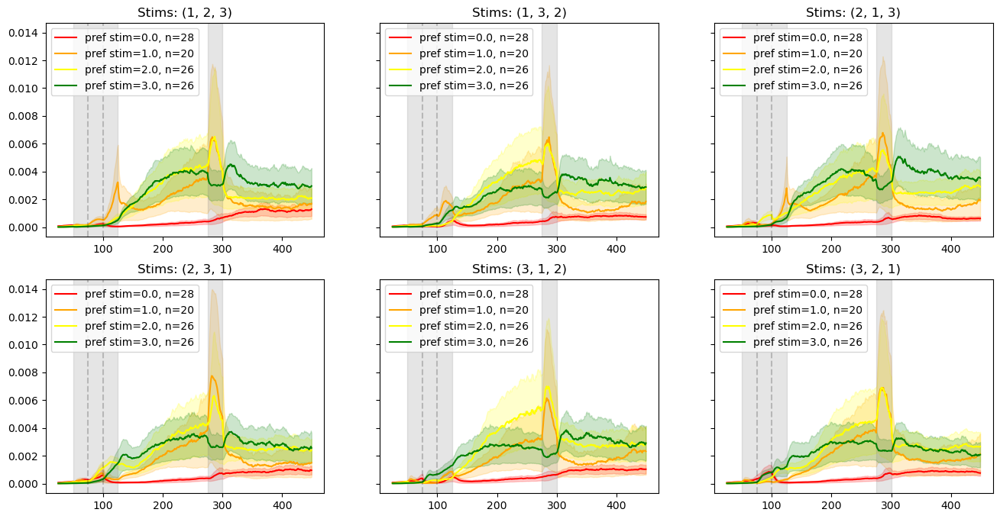

In [5]:
from itertools import permutations

trial_stims = [1, 2, 3]
trial_stim_patterns = list(permutations(trial_stims))

load=3

fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
axs = axs.flatten()
for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
    ax = axs[i_panel]
    # find trials that match
    trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

    maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
    neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
    neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
    stim1s = np.unique(neuron_idxs_tuning)

    trial_frs = rates_data[trial_idxs, :, :]
    trial_frs[:,:,:25] = np.nan
    trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
    colors = ['r','orange', 'yellow', 'g']
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_stim_pattern}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_336438/2284753145.py:22: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_336438/2284753145.py:27: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_336438/2284753145.py:28: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


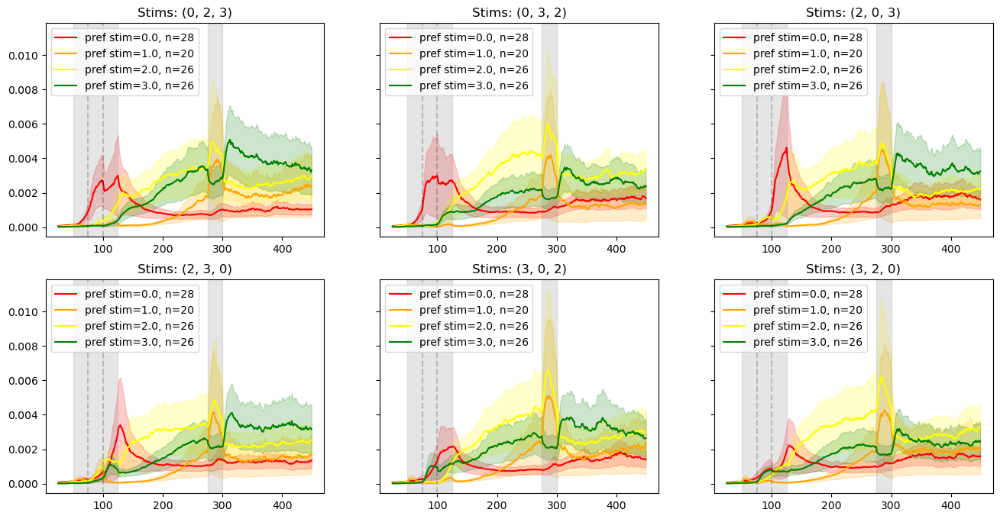

In [6]:
from itertools import permutations

trial_stims = [0, 2, 3]
trial_stim_patterns = list(permutations(trial_stims))

load=3

fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
axs = axs.flatten()
for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
    ax = axs[i_panel]
    # find trials that match
    trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

    maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
    neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
    neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
    stim1s = np.unique(neuron_idxs_tuning)

    trial_frs = rates_data[trial_idxs, :, :]
    trial_frs[:,:,:25] = np.nan
    trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
    colors = ['r','orange', 'yellow', 'g']
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_stim_pattern}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_336438/2813660113.py:22: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_336438/2813660113.py:27: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_336438/2813660113.py:28: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


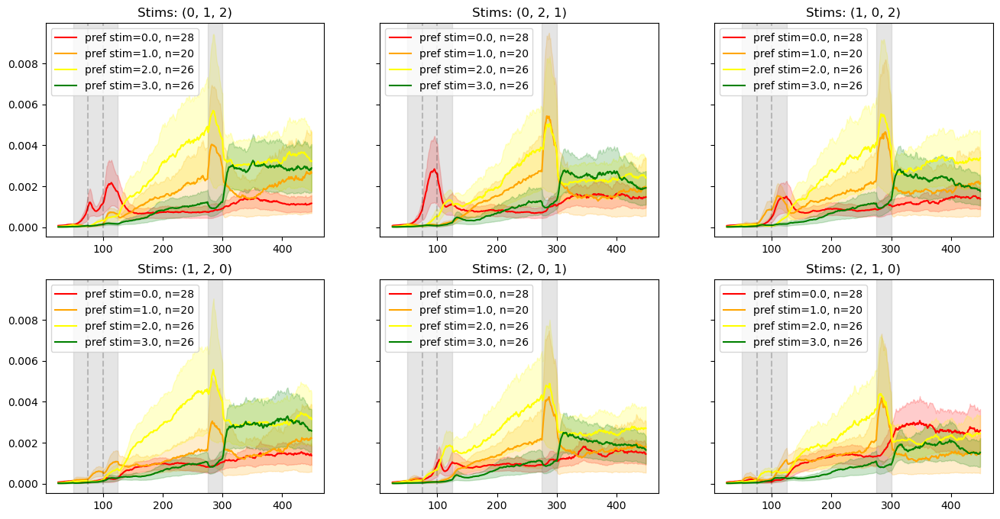

In [7]:
from itertools import permutations

trial_stims = [0, 1, 2]
trial_stim_patterns = list(permutations(trial_stims))

load=3

fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
axs = axs.flatten()
for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
    ax = axs[i_panel]
    # find trials that match
    trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

    maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
    neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
    neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
    stim1s = np.unique(neuron_idxs_tuning)

    trial_frs = rates_data[trial_idxs, :, :]
    trial_frs[:,:,:25] = np.nan
    trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
    colors = ['r','orange', 'yellow', 'g']
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_stim_pattern}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_336438/2656875535.py:22: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_336438/2656875535.py:27: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_336438/2656875535.py:28: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


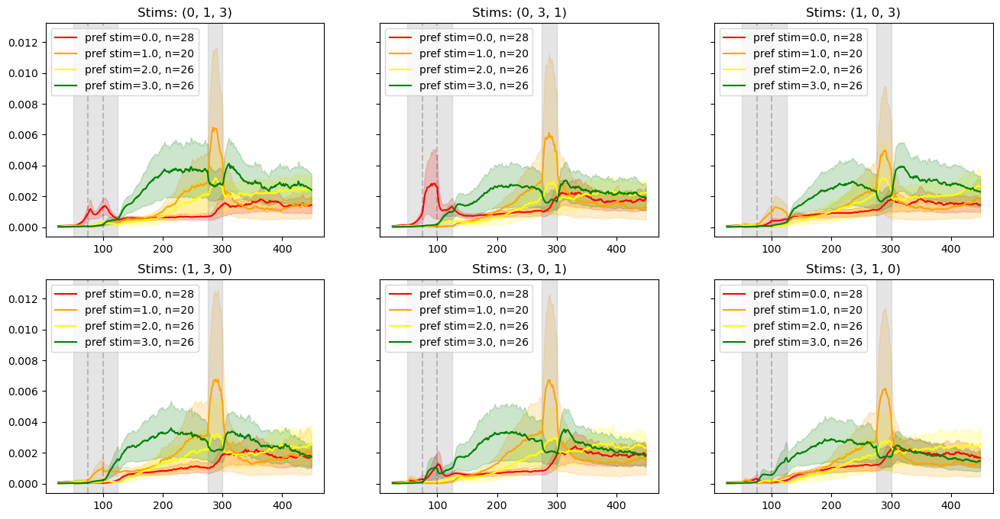

In [8]:
from itertools import permutations

trial_stims = [0, 1, 3]
trial_stim_patterns = list(permutations(trial_stims))

load=3

fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
axs = axs.flatten()
for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
    ax = axs[i_panel]
    # find trials that match
    trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

    maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
    neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
    neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
    stim1s = np.unique(neuron_idxs_tuning)

    trial_frs = rates_data[trial_idxs, :, :]
    trial_frs[:,:,:25] = np.nan
    trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
    colors = ['r','orange', 'yellow', 'g']
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_stim_pattern}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

#### splitting corr/incorr trials

/tmp/ipykernel_299295/876338145.py:27: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_299295/876338145.py:32: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/876338145.py:33: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


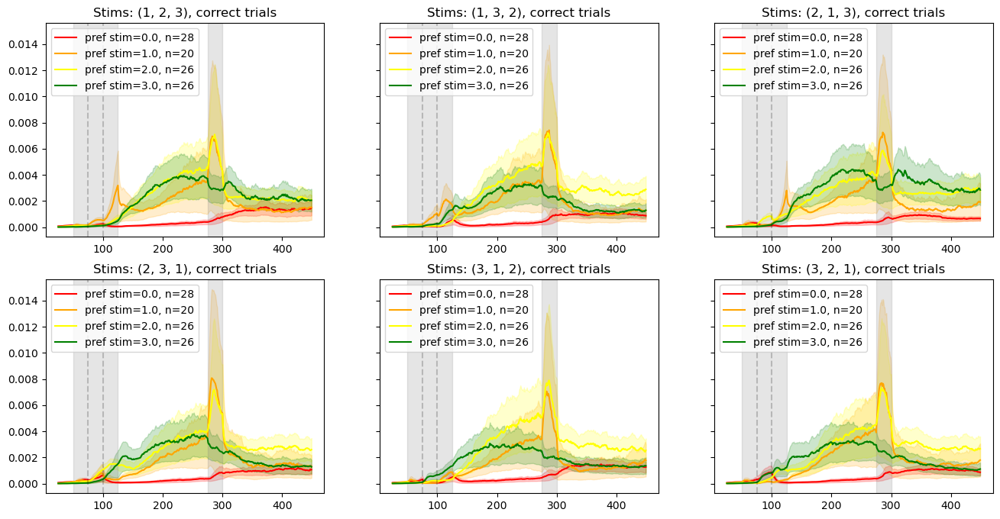

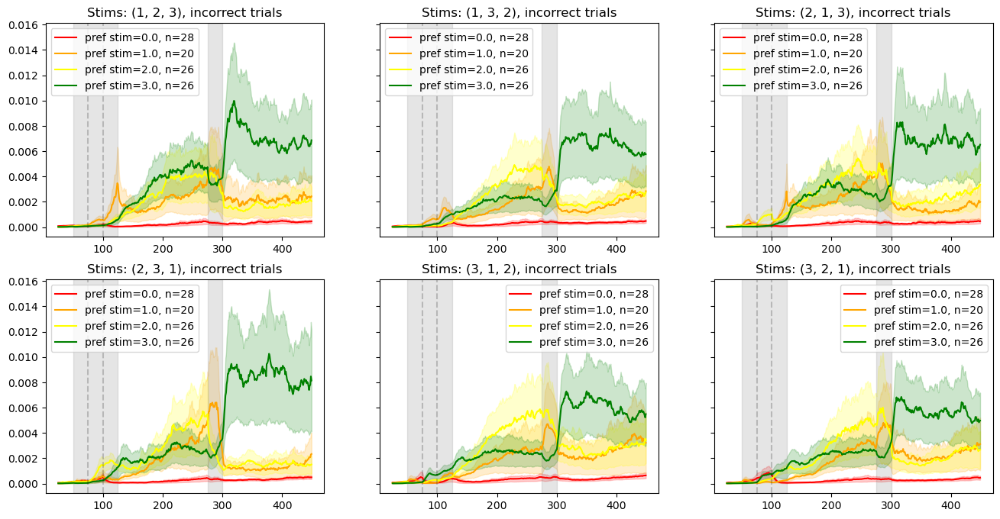

In [26]:
from itertools import permutations

trial_stims = [1, 2, 3]
trial_stim_patterns = list(permutations(trial_stims))

load=3

corr_idx = trial_perfs == 1
incorr_idx = trial_perfs == 0

for i, corr_indices in enumerate([corr_idx, incorr_idx]):
    fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
    axs = axs.flatten()
    for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
        ax = axs[i_panel]
        # find trials that match
        trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]
        trial_idxs = np.intersect1d(trial_idxs, np.where(corr_indices)[0]) # only correct or only incorrect trials

        maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
        neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
        neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
        stim1s = np.unique(neuron_idxs_tuning)

        trial_frs = rates_data[trial_idxs, :, :]
        trial_frs[:,:,:25] = np.nan
        trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
        colors = ['r','orange', 'yellow', 'g']
        for j, stim1 in enumerate(stim1s):
            these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
            trial_rate = trial_fr[these_neuron_idxs, :]
            mean_rate = np.nanmean(trial_rate, axis=0)
            sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
            ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
            ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
        ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
        for k in range(load-1):
            ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
        ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                    color='gray', alpha=0.2)
        
        ax.set_title(f'Stims: {trial_stim_pattern}, {"correct" if i==0 else "incorrect"} trials')
        ax.legend()
    plt.show()
    # fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_299295/3064208350.py:27: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_299295/3064208350.py:32: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/3064208350.py:33: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


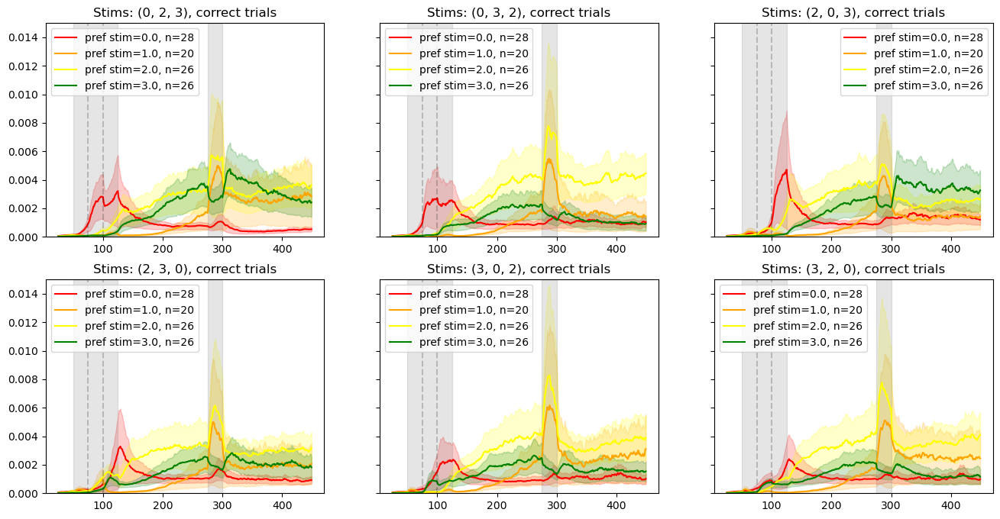

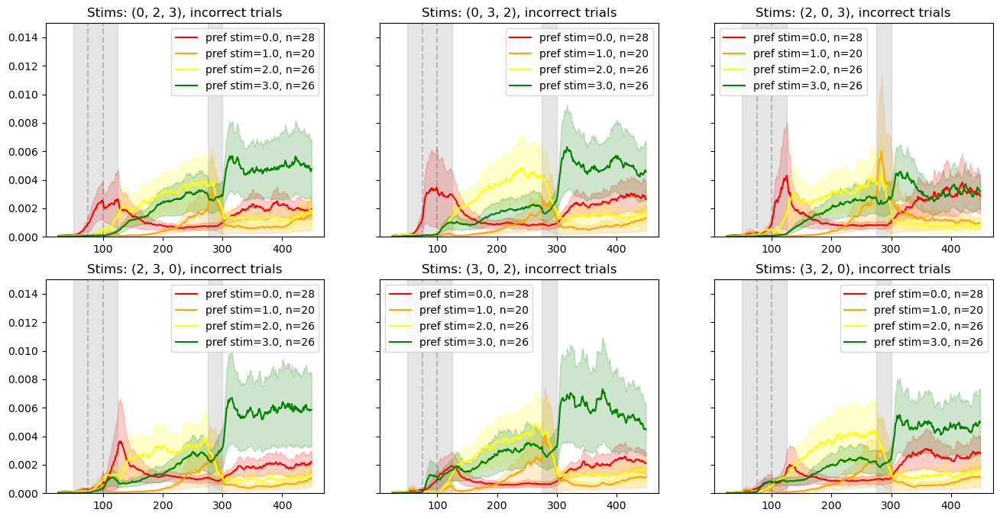

In [30]:
from itertools import permutations

trial_stims = [0, 2, 3]
trial_stim_patterns = list(permutations(trial_stims))

load=3

corr_idx = trial_perfs == 1
incorr_idx = trial_perfs == 0

for i, corr_indices in enumerate([corr_idx, incorr_idx]):
    fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
    axs = axs.flatten()
    for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
        ax = axs[i_panel]
        # find trials that match
        trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]
        trial_idxs = np.intersect1d(trial_idxs, np.where(corr_indices)[0]) # only correct or only incorrect trials

        maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
        neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
        neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
        stim1s = np.unique(neuron_idxs_tuning)

        trial_frs = rates_data[trial_idxs, :, :]
        trial_frs[:,:,:25] = np.nan
        trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
        colors = ['r','orange', 'yellow', 'g']
        for j, stim1 in enumerate(stim1s):
            these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
            trial_rate = trial_fr[these_neuron_idxs, :]
            mean_rate = np.nanmean(trial_rate, axis=0)
            sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
            ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
            ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
        ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
        for k in range(load-1):
            ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
        ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                    color='gray', alpha=0.2)
        ax.set_ylim([0, 0.015])
        ax.set_title(f'Stims: {trial_stim_pattern}, {"correct" if i==0 else "incorrect"} trials')
        ax.legend()
    plt.show()
    # fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_299295/1050352635.py:27: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_299295/1050352635.py:32: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/1050352635.py:33: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


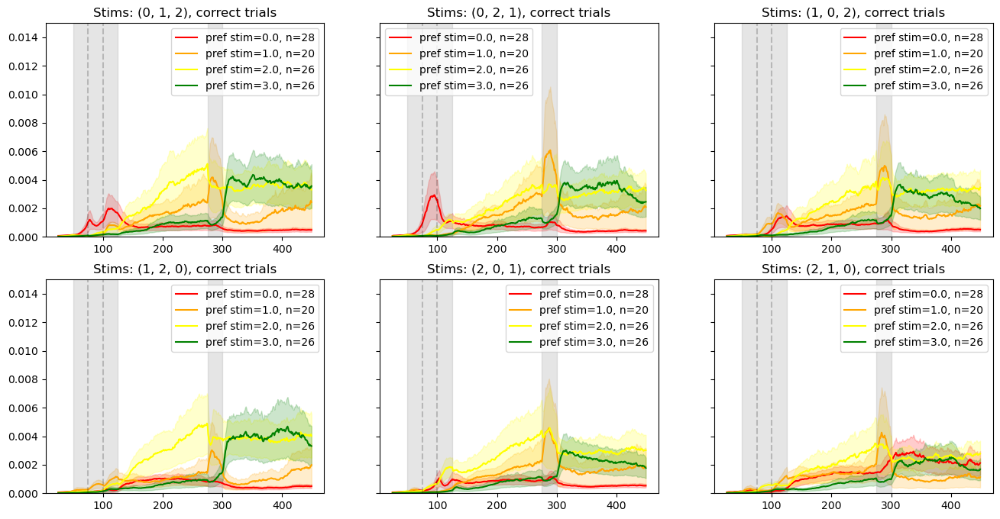

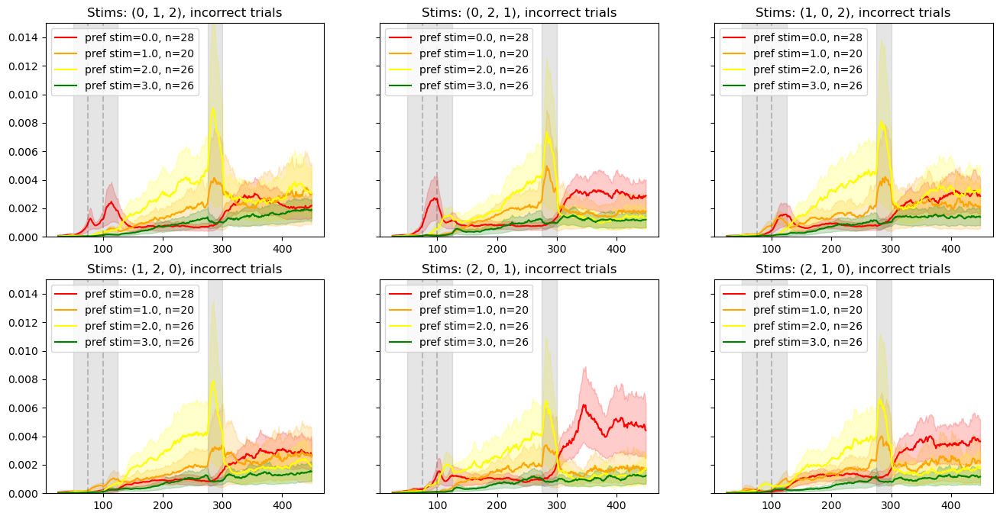

In [31]:
from itertools import permutations

trial_stims = [0, 1, 2]
trial_stim_patterns = list(permutations(trial_stims))

load=3

corr_idx = trial_perfs == 1
incorr_idx = trial_perfs == 0

for i, corr_indices in enumerate([corr_idx, incorr_idx]):
    fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
    axs = axs.flatten()
    for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
        ax = axs[i_panel]
        # find trials that match
        trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]
        trial_idxs = np.intersect1d(trial_idxs, np.where(corr_indices)[0]) # only correct or only incorrect trials

        maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
        neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
        neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
        stim1s = np.unique(neuron_idxs_tuning)

        trial_frs = rates_data[trial_idxs, :, :]
        trial_frs[:,:,:25] = np.nan
        trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
        colors = ['r','orange', 'yellow', 'g']
        for j, stim1 in enumerate(stim1s):
            these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
            trial_rate = trial_fr[these_neuron_idxs, :]
            mean_rate = np.nanmean(trial_rate, axis=0)
            sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
            ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
            ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
        ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
        for k in range(load-1):
            ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
        ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                    color='gray', alpha=0.2)
        ax.set_ylim([0, 0.015])
        ax.set_title(f'Stims: {trial_stim_pattern}, {"correct" if i==0 else "incorrect"} trials')
        ax.legend()
    plt.show()
    # fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_299295/1783356314.py:27: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_299295/1783356314.py:32: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/1783356314.py:33: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


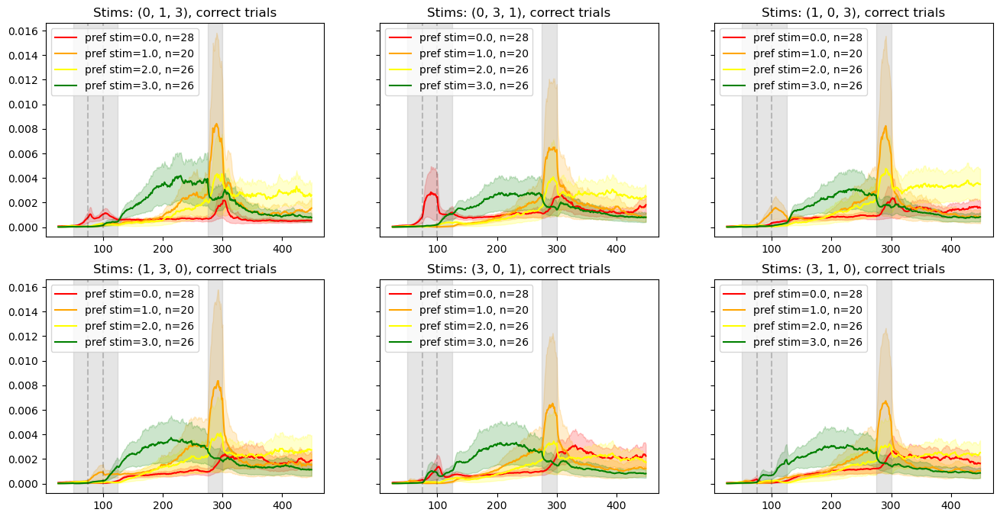

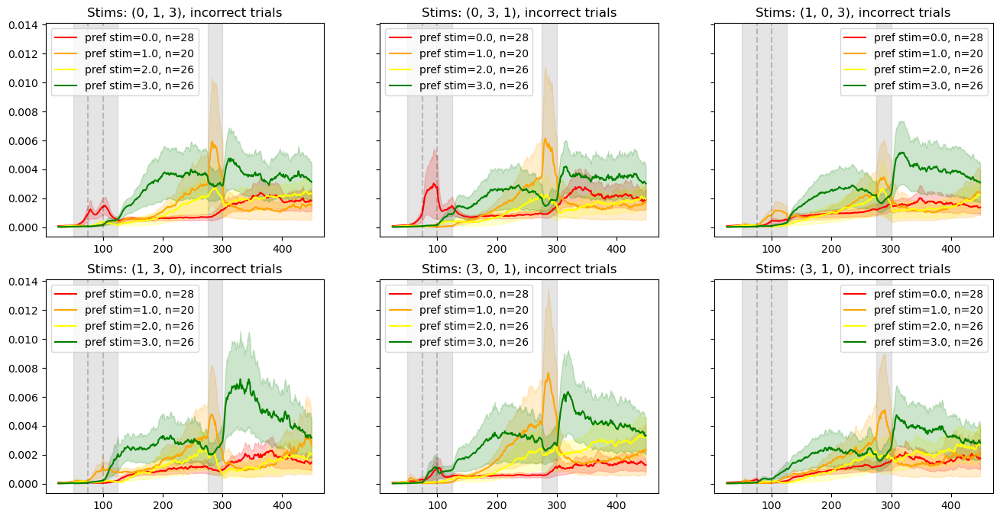

In [29]:
from itertools import permutations

trial_stims = [0, 1, 3]
trial_stim_patterns = list(permutations(trial_stims))

load=3

corr_idx = trial_perfs == 1
incorr_idx = trial_perfs == 0

for i, corr_indices in enumerate([corr_idx, incorr_idx]):
    fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
    axs = axs.flatten()
    for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
        ax = axs[i_panel]
        # find trials that match
        trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]
        trial_idxs = np.intersect1d(trial_idxs, np.where(corr_indices)[0]) # only correct or only incorrect trials

        maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
        neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
        neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
        stim1s = np.unique(neuron_idxs_tuning)

        trial_frs = rates_data[trial_idxs, :, :]
        trial_frs[:,:,:25] = np.nan
        trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
        colors = ['r','orange', 'yellow', 'g']
        for j, stim1 in enumerate(stim1s):
            these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
            trial_rate = trial_fr[these_neuron_idxs, :]
            mean_rate = np.nanmean(trial_rate, axis=0)
            sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
            ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
            ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
        ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
        for k in range(load-1):
            ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
        ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                    color='gray', alpha=0.2)
        
        ax.set_title(f'Stims: {trial_stim_pattern}, {"correct" if i==0 else "incorrect"} trials')
        ax.legend()
    plt.show()
    # fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

### inh neurons only

/tmp/ipykernel_336438/721829911.py:22: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_336438/721829911.py:27: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_336438/721829911.py:28: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


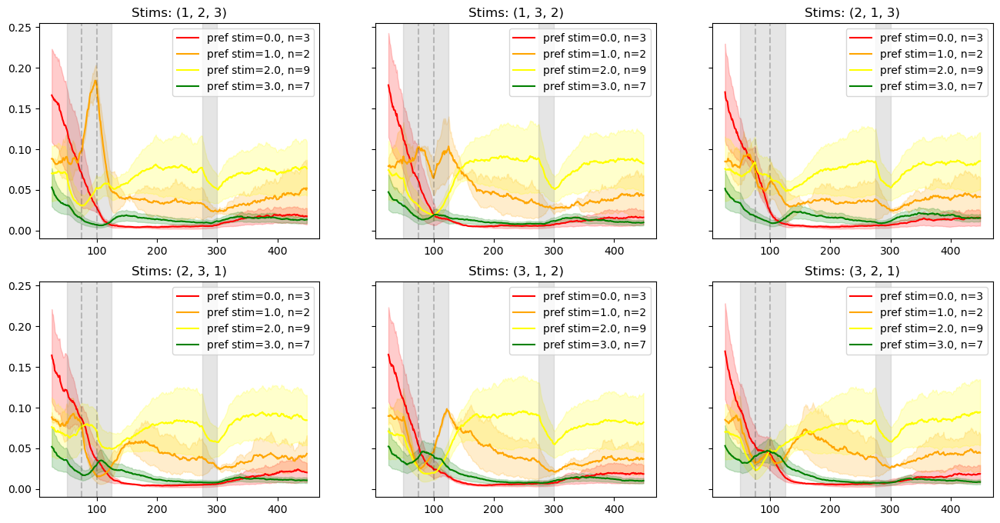

In [9]:
from itertools import permutations

trial_stims = [1, 2, 3]
trial_stim_patterns = list(permutations(trial_stims))

load=3

fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
axs = axs.flatten()
for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
    ax = axs[i_panel]
    # find trials that match
    trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

    maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
    neuron_idxs = np.intersect1d(maint_tuned_only, inh_ind) # example: only look at inhibitory neurons
    neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
    stim1s = np.unique(neuron_idxs_tuning)

    trial_frs = rates_data[trial_idxs, :, :]
    trial_frs[:,:,:25] = np.nan
    trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
    colors = ['r','orange', 'yellow', 'g']
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_stim_pattern}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_336438/770445891.py:22: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_336438/770445891.py:27: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_336438/770445891.py:28: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


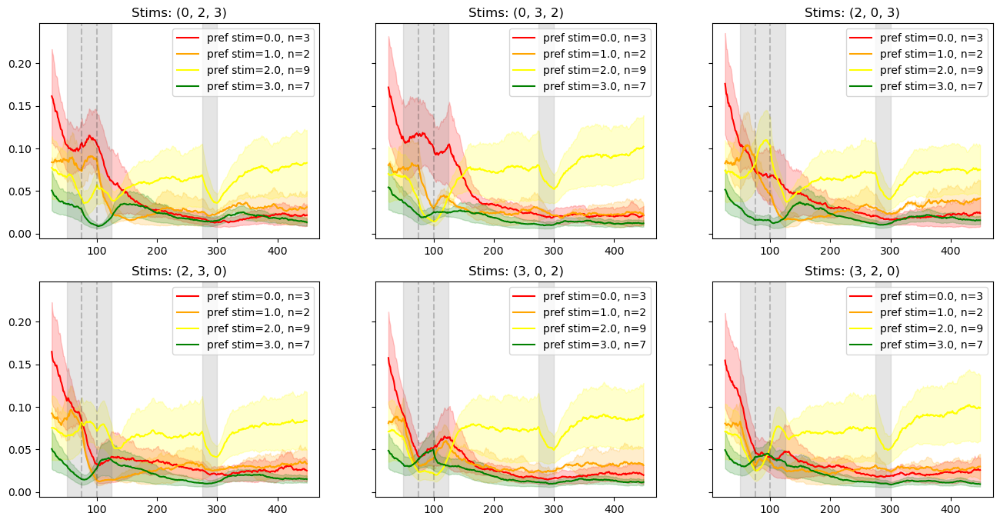

In [10]:
from itertools import permutations

trial_stims = [0, 2, 3]
trial_stim_patterns = list(permutations(trial_stims))

load=3

fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
axs = axs.flatten()
for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
    ax = axs[i_panel]
    # find trials that match
    trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

    maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
    neuron_idxs = np.intersect1d(maint_tuned_only, inh_ind) # example: only look at inhibitory neurons
    neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
    stim1s = np.unique(neuron_idxs_tuning)

    trial_frs = rates_data[trial_idxs, :, :]
    trial_frs[:,:,:25] = np.nan
    trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
    colors = ['r','orange', 'yellow', 'g']
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_stim_pattern}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_336438/2844386399.py:22: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_336438/2844386399.py:27: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_336438/2844386399.py:28: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


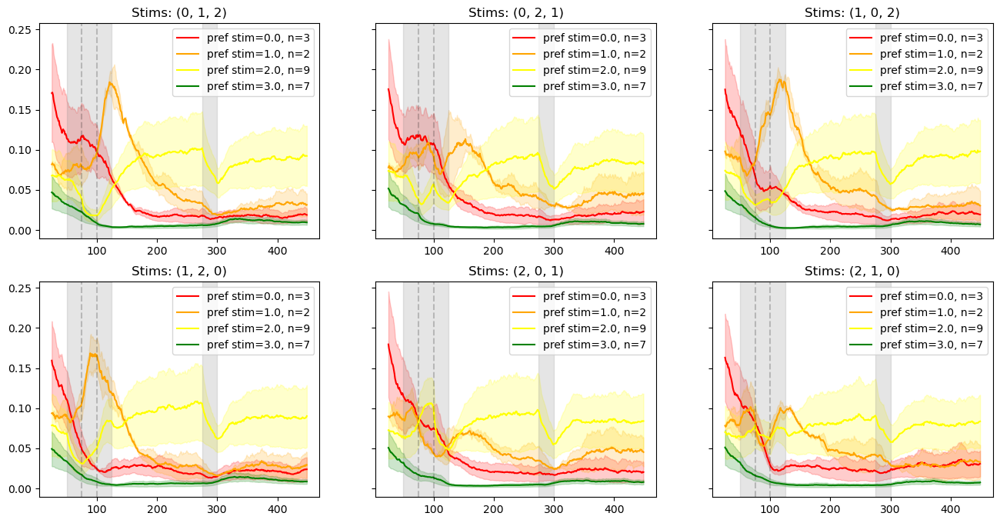

In [11]:
from itertools import permutations

trial_stims = [0, 1, 2]
trial_stim_patterns = list(permutations(trial_stims))

load=3

fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
axs = axs.flatten()
for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
    ax = axs[i_panel]
    # find trials that match
    trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

    maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
    neuron_idxs = np.intersect1d(maint_tuned_only, inh_ind) # example: only look at inhibitory neurons
    neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
    stim1s = np.unique(neuron_idxs_tuning)

    trial_frs = rates_data[trial_idxs, :, :]
    trial_frs[:,:,:25] = np.nan
    trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
    colors = ['r','orange', 'yellow', 'g']
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_stim_pattern}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_336438/75850564.py:22: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_336438/75850564.py:27: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_336438/75850564.py:28: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


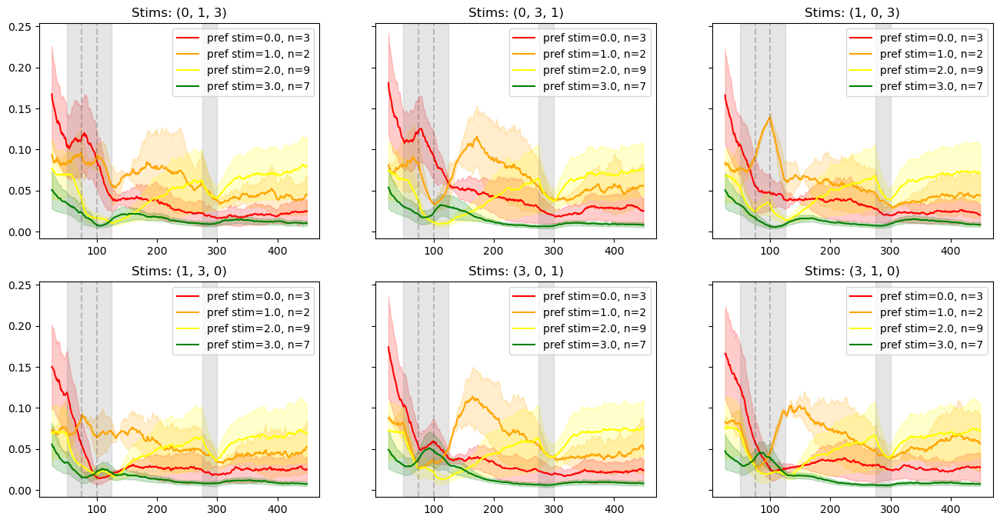

In [12]:
from itertools import permutations

trial_stims = [0, 1, 3]
trial_stim_patterns = list(permutations(trial_stims))

load=3

fig, axs = plt.subplots(2, 3, figsize=(16,8), sharey=True)
axs = axs.flatten()
for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
    ax = axs[i_panel]
    # find trials that match
    trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

    maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
    neuron_idxs = np.intersect1d(maint_tuned_only, inh_ind) # example: only look at inhibitory neurons
    neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
    stim1s = np.unique(neuron_idxs_tuning)

    trial_frs = rates_data[trial_idxs, :, :]
    trial_frs[:,:,:25] = np.nan
    trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
    colors = ['r','orange', 'yellow', 'g']
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_stim_pattern}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

### load 2

In [21]:
trial_idxs

array([], dtype=int64)

/tmp/ipykernel_299295/3014778462.py:22: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_299295/3014778462.py:27: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/3014778462.py:28: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


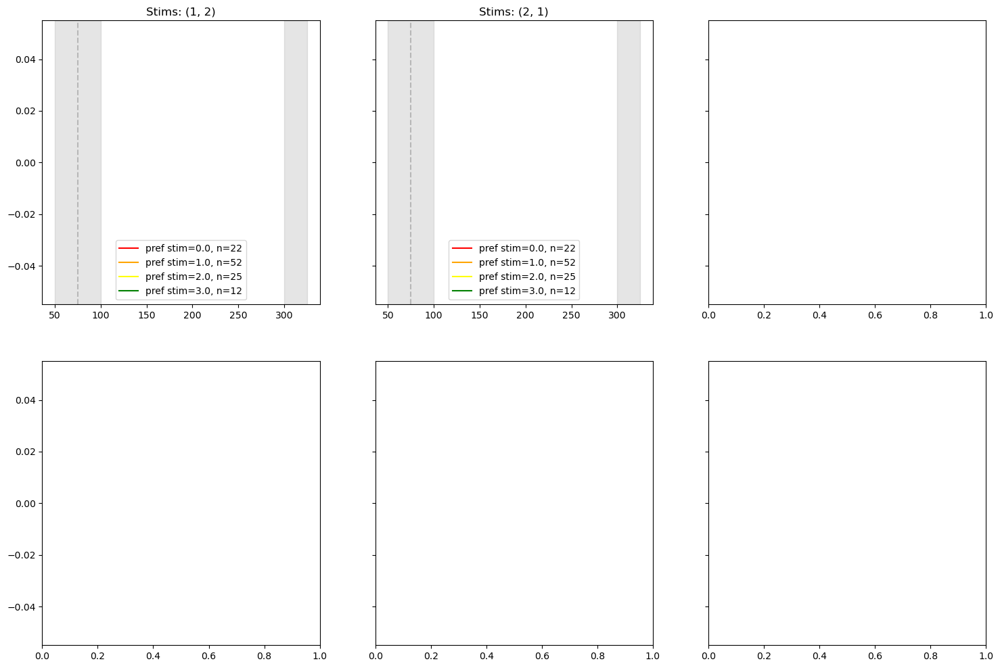

In [ ]:
from itertools import permutations

trial_stims = [1, 2]
trial_stim_patterns = list(permutations(trial_stims))

load=2

fig, axs = plt.subplots(2, 3, figsize=(18,12), sharey=True)
axs = axs.flatten()
for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
    ax = axs[i_panel]
    # find trials that match
    trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

    maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
    neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
    neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
    stim1s = np.unique(neuron_idxs_tuning)

    trial_frs = rates_data[trial_idxs, :, :]
    trial_frs[:,:,:25] = np.nan
    trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
    colors = ['r','orange', 'yellow', 'g']
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_stim_pattern}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

/tmp/ipykernel_299295/2664344635.py:22: RuntimeWarning: Mean of empty slice
  trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
/tmp/ipykernel_299295/2664344635.py:27: RuntimeWarning: Mean of empty slice
  mean_rate = np.nanmean(trial_rate, axis=0)
/tmp/ipykernel_299295/2664344635.py:28: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')


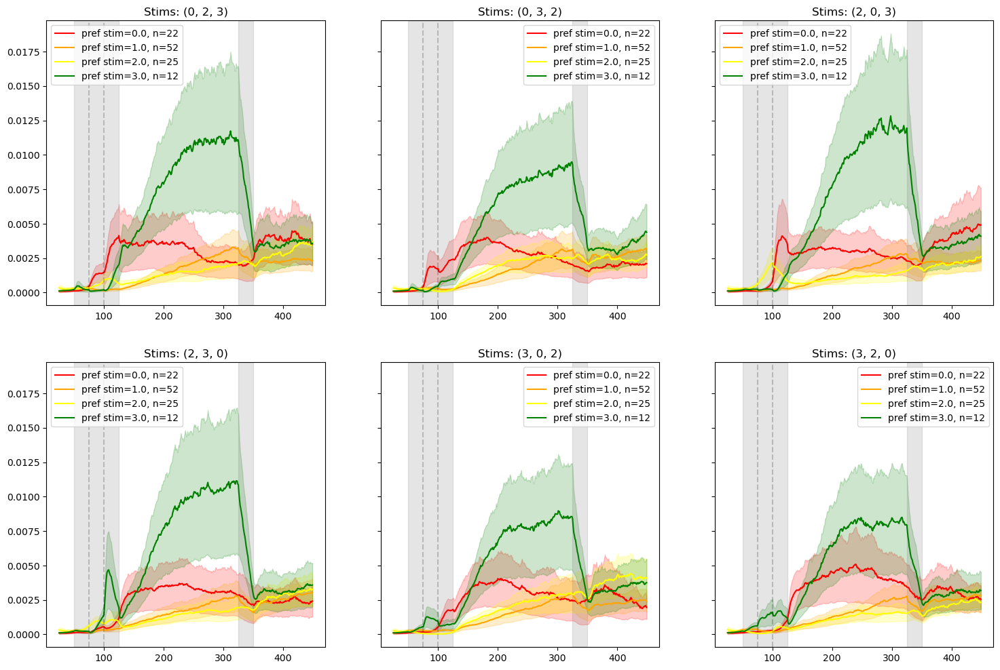

In [ ]:
from itertools import permutations

trial_stims = [0, 2, 3]
trial_stim_patterns = list(permutations(trial_stims))

load=3

fig, axs = plt.subplots(2, 3, figsize=(18,12), sharey=True)
axs = axs.flatten()
for i_panel, trial_stim_pattern in enumerate(trial_stim_patterns):
    ax = axs[i_panel]
    # find trials that match
    trial_idxs = np.where(np.all(trial_labels[:,[2,3,4]] == [trial_stim_pattern], axis=1))[0]

    maint_tuned_only = np.where((np.isnan(stim1_stimtuning)) & ~np.isnan(maint_stimtuning))[0] # maint-tuned, not stim-tuned
    neuron_idxs = np.intersect1d(maint_tuned_only, exc_ind) # example: only look at excitatory neurons
    neuron_idxs_tuning = maint_stimtuning[neuron_idxs]
    stim1s = np.unique(neuron_idxs_tuning)

    trial_frs = rates_data[trial_idxs, :, :]
    trial_frs[:,:,:25] = np.nan
    trial_fr = np.nanmean(trial_frs, axis=0) # neurons x time
    colors = ['r','orange', 'yellow', 'g']
    for j, stim1 in enumerate(stim1s):
        these_neuron_idxs = neuron_idxs[neuron_idxs_tuning == stim1]
        trial_rate = trial_fr[these_neuron_idxs, :]
        mean_rate = np.nanmean(trial_rate, axis=0)
        sem_rate = scipy.stats.sem(trial_rate, axis=0, nan_policy='omit')
        ax.plot(mean_rate, label=f'pref stim={stim1}, n={len(these_neuron_idxs)}', color = colors[j])
        ax.fill_between(np.arange(len(mean_rate)), mean_rate-sem_rate, mean_rate+sem_rate, color=colors[j], alpha=0.2)
    ax.axvspan(settings['stim_on'], settings['stim_on'] + settings['stim_dur']*load, color='gray', alpha=0.2)
    for k in range(load-1):
        ax.axvline(settings['stim_on'] + settings['stim_dur']*(k+1), color='black', alpha=0.2, linestyle='--')
    ax.axvspan(settings['stim_on'] + settings['stim_dur']*load + settings['delay'], settings['stim_on'] + settings['stim_dur']*load + settings['delay'] + settings['stim_dur'], 
                color='gray', alpha=0.2)
    
    ax.set_title(f'Stims: {trial_stim_pattern}')
    ax.legend()
# fig.suptitle(f'Maint stim-tuned but not stim1-tuned, load {load}')

## lesion groups